In [2]:
from PIL import Image
import matplotlib.pyplot as plt
import os
import numpy as np
import sys

In [19]:
# folder_to_scan = './results/00001-sgan-ffhq-mars-1gpu/'
folder_to_scan = './results/00002-sgan-ffhq-mars-1gpu/'

In [20]:
files = os.listdir(folder_to_scan)

In [21]:
valid_file_types = ['.png']
valid_files = []
for file in files:
    f, fe = os.path.splitext(file)
    if fe in valid_file_types:
        valid_files.append(file)

full_path_valid_files = [folder_to_scan+file for file in valid_files]
fakes = [ff for ff in full_path_valid_files if 'fake' in ff]

In [30]:
fakes.sort()

In [31]:
im = Image.open(fakes[-1])

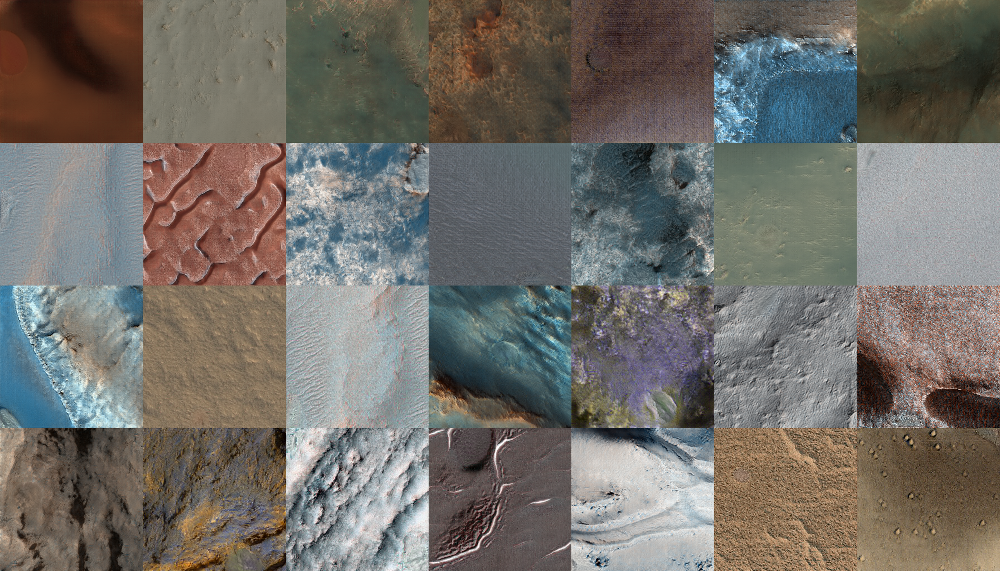

In [32]:
im

`512 x 512` configuration

In [46]:
# shift (in number of images)
xs = 0 # x_shift
ys = 0 # y_shift
# windows (in number of images)
xd = 4
yd = 3
# image size
im_s = 512

imc = im.crop((xs*im_s, ys*im_s ,(xs+xd)*im_s, (ys+yd)*im_s))
imc_np = np.asarray(imc)

In [47]:
import imageio

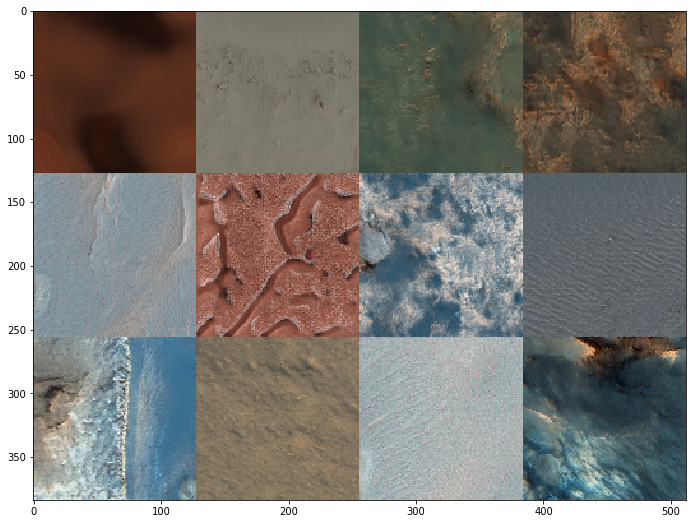

In [54]:
plt.figure(figsize=(12,9))
plt.imshow(imc_np)

### Save gif

here I am using a compression factor, `compress`, to reduce the size of the gif file.

In [55]:
compress = 4

images = []
for ff in fakes[::3]:
    im = Image.open(ff) 
    imc = im.crop((xs*im_s, ys*im_s ,(xs+xd)*im_s, (ys+yd)*im_s))
    new_size = tuple([int(round(s/compress)) for s in list(imc.size)])
    imc = imc.resize(new_size)
    imc_np = np.asarray(imc)
    images.append(imc_np)

In [56]:
imageio.mimsave('./test_512_3.gif', images, format='GIF', fps=6)